In [1]:
#@title librerías
from google.colab import drive
import os
import math
from IPython.display import Image
import matplotlib.pyplot as plt
import cv2
import os

In [2]:
#@title **Se carga el directorio google drive**
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#@title **Archivos del directorio**
%cd /content/drive/MyDrive/YOLO_CUSTOM_DATASE
%pwd
%ls

/content/drive/MyDrive/YOLO_CUSTOM_DATASE
 Change_name.ps1                  grad-cam-formula-student/   train.txt
 Change_name_replace.ps1          images/                     Tutorial/
 classes.names                    images_ori/                 valid.txt
'Comparativo YOLO_SE_CBAM.docx'   labels/
 darknet/                         PyTorch-YOLOv3/


In [ ]:
%pwd
%rm train.txt
%rm valid.txt

rm: cannot remove 'train.txt': No such file or directory


In [ ]:
#@title **Se genera el dataset de entrenamiento y de test**
Directorio = '/content/drive/MyDrive/YOLO_CUSTOM_DATASE'
train = 0.8
test = 0.2
Images = Directorio+'/images'
Total_images = 0
for m in os.listdir(Images):
  Total_images += 1

train = math.floor(Total_images * train)
test = Total_images - train
print('Total Imagenes',Total_images,'\nTotal imagenes entrenamiento',train, '\nTotal imagenes de test', test)

def GenDataSet(Directorio, train, test):
  it=0
  for m in os.listdir(Images):
    if it <= train:
      with open(Directorio + '/' + 'train.txt' , 'a') as writefile:    
        writefile.write('data/custom/images/'+ m +'\n')
    else:
      with open(Directorio + '/' + 'valid.txt' , 'a') as writefile:    
        writefile.write('data/custom/images/'+ m +'\n')  
    it+=1          
##Se generar los archivos de entrenamiento y test
GenDataSet(Directorio, train, test)

Total Imagenes 245 
Total imagenes entrenamiento 196 
Total imagenes de test 49


In [ ]:
#@title Se carga la información en el directorio data/custon de YOLO
%cp -r /content/drive/MyDrive/YOLO_CUSTOM_DATASE/images /content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3/data/custom/images
%cp -r /content/drive/MyDrive/YOLO_CUSTOM_DATASE/labels /content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3/data/custom/labels
%cp  /content/drive/MyDrive/YOLO_CUSTOM_DATASE/train.txt /content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3/data/custom/train.txt
%cp  /content/drive/MyDrive/YOLO_CUSTOM_DATASE/valid.txt /content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3/data/custom/valid.txt
%cp  /content/drive/MyDrive/YOLO_CUSTOM_DATASE/classes.names /content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3/data/custom/classes.names

In [ ]:
#@title Se regresa al directorio YOLO
%cd PyTorch-YOLOv3/
%ls

/content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3
assets/       detect.py      models_original.py  __pycache__/      train.py
checkpoints/  LICENSE        models.py           README.md         utils/
config/       logs/          output/             requirements.txt  weights/
data/         models_mdf.py  plot_yolo_log.py    test.py


In [ ]:
#@title validamos el directorio custom de YOLO
%cd data/custom/
%ls

/content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3/data/custom
classes.names  images/  labels/  train.txt  valid.txt


In [ ]:
#@title Regresamos el directorio raiz de YOLO
%cd ../..
%pwd

/content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3


'/content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3'

In [ ]:
#@title Instalar los requerimientos:
!pip3 install -r requirements.txt

In [ ]:
#@title Se realiza entrenamiento del modelo original:
##Sentencia cuando se desea iniciar por primera vez
#!python3 train.py --model_def config/yolov3-tiny_custom.cfg --data config/custom.data --pretrained_weights weights/yolov3-tiny.weights --epochs 100
##Sentencia cuando se desea iniciar a partir de un checkpoint:
!python3 train.py --model_def config/yolov3-tiny_custom.cfg --data config/custom.data --pretrained_weights checkpoints/yolov3_ckpt_99.pth --epochs 100

Se han truncado las últimas 5000 líneas del flujo de salida.
| recall50   | 1.000000     | 1.000000     |
| recall75   | 0.850000     | 1.000000     |
| precision  | 1.000000     | 0.913043     |
| conf_obj   | 0.999429     | 0.998262     |
| conf_noobj | 0.000117     | 0.000160     |
+------------+--------------+--------------+
Total loss 0.10467073321342468
---- ETA 0:00:04.955727
[W IndexingUtils.h:30] Warning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (function expandTensors)
[W IndexingUtils.h:30] Warning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (function expandTensors)
[W IndexingUtils.h:30] Warning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (function expandTensors)
[W IndexingUtils.h:30] Warning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (function expandTensors)
[W IndexingUtils.h:30] War

In [ ]:
#@title Se realiza la predicción del modelo:
!python3 detect.py --model_def config/yolov3-tiny_custom.cfg --weights_path checkpoints/yolov3_ckpt_99.pth --image_folder data/samples/sample_custom/ --class_path data/custom/classes.names --conf_thres 0.8

Namespace(batch_size=1, checkpoint_model=None, class_path='data/custom/classes.names', conf_thres=0.8, image_folder='data/samples/sample_custom/', img_size=416, model_def='config/yolov3-tiny_custom.cfg', n_cpu=0, nms_thres=0.4, weights_path='checkpoints/yolov3_ckpt_99.pth')

Performing object detection:
	+ Batch 0, Inference Time: 0:00:00.035099
	+ Batch 1, Inference Time: 0:00:00.027302
	+ Batch 2, Inference Time: 0:00:00.022192
	+ Batch 3, Inference Time: 0:00:00.024178
	+ Batch 4, Inference Time: 0:00:00.215055
	+ Batch 5, Inference Time: 0:00:00.242494
	+ Batch 6, Inference Time: 0:00:00.239431
	+ Batch 7, Inference Time: 0:00:00.279895
	+ Batch 8, Inference Time: 0:00:00.208455
	+ Batch 9, Inference Time: 0:00:00.263535

Saving images:
(0) Image: 'data/samples/sample_custom/ag_img_40.jpg'
	+ Label: helmet, Conf: 1.00000
(1) Image: 'data/samples/sample_custom/cm_img_31.png'
	+ Label: helmet, Conf: 1.00000
	+ Label: helmet, Conf: 1.00000
	+ Label: helmet, Conf: 1.00000
	+ Label: hel

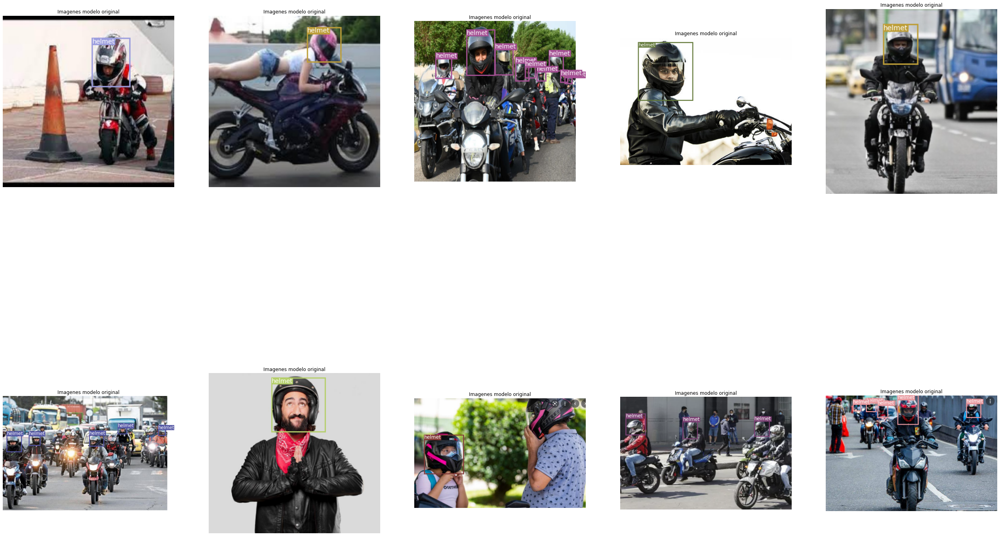

In [ ]:
#@title **Validación de imagenes con Modelo original**
Directorio = '/content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3/output'
plt.figure(figsize=(45,30))
pos = 1
for m in os.listdir(Directorio):
  name = Directorio + '/' + m
  plt.title('Imagenes modelo original')
  if m != '.ipynb_checkpoints':
    img = cv2.imread(name)
    plt.subplot(2,5,pos)
    plt.imshow(img[:,:,(2,1,0)]) 
    plt.axis('off')
    pos += 1
plt.title('Imagenes modelo original')
plt.show()

In [ ]:
!python3 plot_yolo_log.py logs/2021_11_24__02_54_51/events.out.tfevents.1637722495.69971e765bfd.4984.0

In [ ]:
##Crear YOLO + modulo de atención.
##Sentencia cuando se desea iniciar por primera vez
#!python3 train.py --model_def config/yolov3-tiny_custom_se.cfg --data config/custom.data --pretrained_weights weights/yolov3-tiny.weights --epochs 100
##Sentencia cuando se desea iniciar a partir de un checkpoint:
!python3 train.py --model_def config/yolov3-tiny_custom_se.cfg --data config/custom.data --pretrained_weights checkpoints/yolov3_ckpt_99.pth --epochs 100

Se han truncado las últimas 5000 líneas del flujo de salida.
| recall50   | 1.000000     | 1.000000     |
| recall75   | 1.000000     | 1.000000     |
| precision  | 0.937500     | 0.833333     |
| conf_obj   | 0.999145     | 0.999384     |
| conf_noobj | 0.000143     | 0.000181     |
+------------+--------------+--------------+
Total loss 0.11213687062263489
---- ETA 0:00:04.526475
[W IndexingUtils.h:30] Warning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (function expandTensors)
[W IndexingUtils.h:30] Warning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (function expandTensors)
[W IndexingUtils.h:30] Warning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (function expandTensors)
[W IndexingUtils.h:30] Warning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (function expandTensors)
[W IndexingUtils.h:30] War

In [ ]:
!python3 detect.py --model_def config/yolov3-tiny_custom_se.cfg --weights_path checkpoints/yolov3_ckpt_22.pth --image_folder data/samples/sample_custom/ --class_path data/custom/classes.names --conf_thres 0.8

Namespace(batch_size=1, checkpoint_model=None, class_path='data/custom/classes.names', conf_thres=0.8, image_folder='data/samples/sample_custom/', img_size=416, model_def='config/yolov3-tiny_custom_se.cfg', n_cpu=0, nms_thres=0.4, weights_path='checkpoints/yolov3_ckpt_22.pth')

Performing object detection:
	+ Batch 0, Inference Time: 0:00:00.036666
	+ Batch 1, Inference Time: 0:00:00.030464
	+ Batch 2, Inference Time: 0:00:00.025525
	+ Batch 3, Inference Time: 0:00:00.025890
	+ Batch 4, Inference Time: 0:00:00.028939
	+ Batch 5, Inference Time: 0:00:00.033456
	+ Batch 6, Inference Time: 0:00:00.024760
	+ Batch 7, Inference Time: 0:00:00.032465
	+ Batch 8, Inference Time: 0:00:00.023117
	+ Batch 9, Inference Time: 0:00:00.038671

Saving images:
(0) Image: 'data/samples/sample_custom/ag_img_40.jpg'
	+ Label: helmet, Conf: 1.00000
(1) Image: 'data/samples/sample_custom/cm_img_31.png'
	+ Label: helmet, Conf: 1.00000
	+ Label: helmet, Conf: 1.00000
	+ Label: helmet, Conf: 1.00000
	+ Label: 

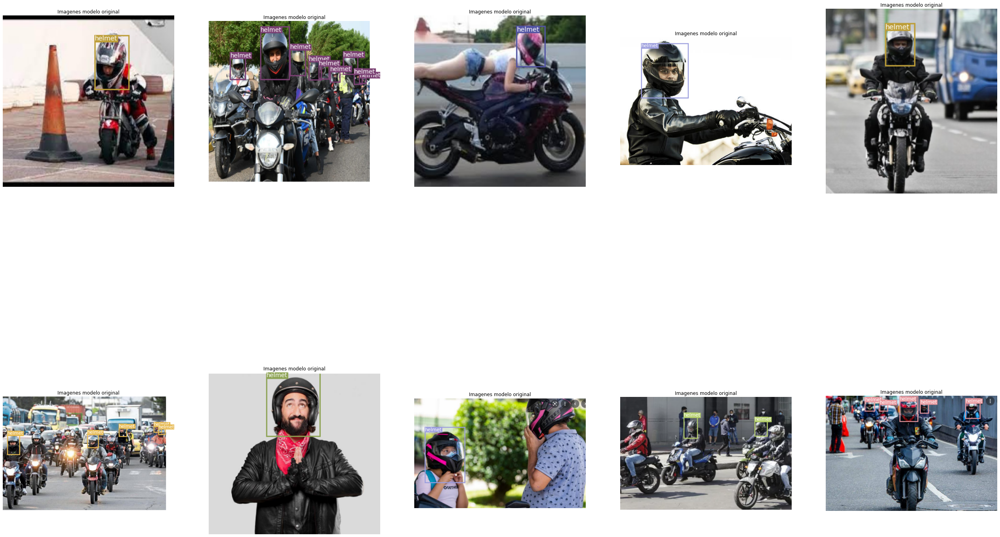

In [ ]:
#@title **Validación de imagenes con Modelo SE**
Directorio = '/content/drive/MyDrive/YOLO_CUSTOM_DATASE/PyTorch-YOLOv3/output'
plt.figure(figsize=(45,30))
pos = 1
for m in os.listdir(Directorio):
  name = Directorio + '/' + m
  plt.title('Imagenes modelo original')
  if m != '.ipynb_checkpoints' and  m != 'curve.png':
    img = cv2.imread(name)
    plt.subplot(2,5,pos)
    plt.imshow(img[:,:,(2,1,0)]) 
    plt.axis('off')
    pos += 1
plt.title('Imagenes modelo original')
plt.show()

In [ ]:
!python3 plot_yolo_log.py logs/2021_11_24__03_58_38/events.out.tfevents.1637726321.69971e765bfd.14374.0

{'images': [], 'audio': [], 'histograms': [], 'scalars': ['loss_1', 'x_1', 'y_1', 'w_1', 'h_1', 'conf_1', 'cls_1', 'cls_acc_1', 'recall50_1', 'recall75_1', 'precision_1', 'conf_obj_1', 'conf_noobj_1', 'loss_2', 'x_2', 'y_2', 'w_2', 'h_2', 'conf_2', 'cls_2', 'cls_acc_2', 'recall50_2', 'recall75_2', 'precision_2', 'conf_obj_2', 'conf_noobj_2', 'loss', 'val_precision', 'val_recall', 'val_mAP', 'val_f1'], 'distributions': [], 'tensors': [], 'graph': False, 'meta_graph': False, 'run_metadata': []}
100
[ScalarEvent(wall_time=1637726332.4461555, step=0, value=0.40915730595588684), ScalarEvent(wall_time=1637726341.0848641, step=1, value=0.36067458987236023), ScalarEvent(wall_time=1637726350.2022238, step=2, value=0.3482915163040161), ScalarEvent(wall_time=1637726358.3256335, step=3, value=0.5598766803741455), ScalarEvent(wall_time=1637726367.8459942, step=4, value=0.4858269989490509), ScalarEvent(wall_time=1637726377.2751787, step=5, value=0.5998863577842712), ScalarEvent(wall_time=1637726386.

In [ ]:
#@title Clonación del GitHub fuente de creación código de GradCam https://github.com/Sibozhu/grad-cam-formula-student.git
#!git clone https://github.com/Sibozhu/grad-cam-formula-student.git

In [4]:
#@title Nos Ubicamos en el directorio del repositorio donde tomaraemos las utilidades de gradcam
%cd grad-cam-formula-student/
%pwd
%ls

/content/drive/My Drive/YOLO_CUSTOM_DATASE/grad-cam-formula-student
cfg/              main_folder.py      __pycache__/  results/      sample_data/
dependencies.txt  main_single_img.py  README.md     results_ori/  src/


In [5]:
#@title Librerías que se van a usar para la generación del GradCam
from torchvision import models, transforms
from src.utils.models import Darknet
from src.utils.grad_cam import GradCAM
import PIL
from PIL import Image, ImageDraw
import numpy as np
import torch
import gc

In [7]:
#@title  Variables Globales para la generación del GradCam del modelo Original
Directorio = 'results'
#Archivo con información de configuración del modelo:
model_conf = '../PyTorch-YOLOv3/config/yolov3-tiny_custom.cfg'
image_path  = '../PyTorch-YOLOv3/data/samples/sample_custom/'
#Tamaño de entrada de la arquitectura:
input_size = 1536
#Se crear el modelo a partir del archivo de configuración:
model = Darknet(model_conf, input_size)

##Carga de los pesos del modelo:
#1. Si se va a cargar archivo de pesos utilizar:
#weigths_path = '../PyTorch-YOLOv3/weights/yolov3-tiny.weights'
#model.load_weights(weigths_path)
#2. Si se va a cargar archivo de checkpoints utilizar:
checkpoint_path = '../PyTorch-YOLOv3/checkpoints_ori/yolov3_ckpt_99.pth'
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))

##Capa del modelo a validar la atención:
intersting_layer = 'module_list.22.conv_22'

../PyTorch-YOLOv3/config/yolov3-tiny_custom.cfg


/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
#@title Forma de evidenciar los nombres de las capas del modelo:
#Validamos el nombre de las capas:
#print(model.named_modules)
#h = model.named_modules
for i in model.named_modules():
  #print(0,i[1])
  print('nombre de las capas',i[0])

In [6]:
#@title Funciones creadas para la generación de la funcionalidad
#Funcion de preparación de las imagenes a validar
def preparated_images(image_path, name_image):
  raw_img = Image.open(image_path + name_image).convert('RGB')
  w,h = raw_img.width,raw_img.height

  max_dimension = max(h, w)
  pad_w = int((max_dimension - w) / 2)
  pad_h = int((max_dimension - h) / 2)

  raw_img = transforms.functional.pad(raw_img, padding=(pad_w, pad_h, pad_w, pad_h), fill=(127, 127, 127), padding_mode="constant")
  raw_img = transforms.functional.resize(raw_img, (input_size, input_size))
  flag_image = np.array(raw_img)   

  raw_img = transforms.functional.to_tensor(raw_img)

  image = raw_img.unsqueeze(0)
  #print(image.shape)
  raw_img = raw_img.permute(2, 1, 0)
  #print(w,h, pad_w, pad_h)
  return raw_img, flag_image, image

def gradCam_result(image,intersting_layer, img_name):
  device = 'cpu' 
  grad_cam = GradCAM(model=model)
  probs, idx = grad_cam.forward(image.to(device))
  #print(probs, idx[0])  
  #img_name = 'cm_img_31'
  grad_cam.backward(idx=idx[0])
  output = grad_cam.generate(target_layer=intersting_layer)
  grad_cam_save('results/heatmap/{}_grad_cam_{}.png'.format(img_name, intersting_layer), output, flag_image)
  return output

def grad_cam_save(filename, flag_data, raw_img):
    height, width, _ = raw_img.shape
    flag_data = cv2.resize(flag_data, (width, height))
    flag_data = cv2.applyColorMap(np.uint8(flag_data * 255.0), cv2.COLORMAP_JET)
    flag_data = flag_data.astype(np.float) + raw_img.astype(np.float)
    flag_data = flag_data / flag_data.max() * 255.0
    cv2.imwrite(filename, np.uint8(flag_data))  

def compare_heatmap(img_name, intersting_layer):
  grad_cam_image_path = 'results/heatmap/{}_grad_cam_{}.png'.format(img_name, intersting_layer)
  yolov3_output_path = '../PyTorch-YOLOv3/output/' + img_name + '.png'
  grad_img = Image.open(grad_cam_image_path)
  pred_img = Image.open(yolov3_output_path).convert('RGB')
  w,h = pred_img.width,pred_img.height
  max_dimension = max(h, w)
  pad_w = int((max_dimension - w) / 2)
  pad_h = int((max_dimension - h) / 2)

  pred_img = transforms.functional.pad(pred_img, padding=(pad_w, pad_h, pad_w, pad_h), fill=(127, 127, 127), padding_mode="constant")
  pred_img = transforms.functional.resize(pred_img, (input_size, input_size))

  imgs    = [grad_img, pred_img]
  # # pick the image which is the smallest, and resize the others to match it (can be arbitrary image shape here)
  min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]
  imgs_comb = np.hstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )

  imgs_comb = PIL.Image.fromarray( imgs_comb)
  imgs_comb.save( 'results/{}_{}_compare.png'.format(img_name, intersting_layer)) 

In [ ]:
#@title Ejemplo de calculo de gradCam por una sola imagen:
#raw_img, flag_image, image = preparated_images(image_path, 'cm_img_31.png')
#output = gradCam_result(image, intersting_layer, 'cm_img_31')
#compare_heatmap('cm_img_31', intersting_layer)


In [ ]:
#@title Se calcula la informacion del gradcam de las imagenes de pruebas:
for m in os.listdir(image_path):
  if m != '.ipynb_checkpoints' and  m != 'heatmap':
    """if m == 'ag_img_40.jpg' and m == 'mg_img56.jpg' and m == 'cm_img_31.png' and m == 'new_img_1.png' and m == 'new_img_3.png' and m == 'new_img_4.png' and m == 'new_img_5.png' and m == 'new_img_.png':"""
    if m != 'ag_img_40.jpg' and m != 'mg_img56.jpg' and m != 'cm_img_31.png' and m != 'new_img_1.png' and m != 'new_img_3.png' and m != 'new_img_4.png' and m != 'new_img_5.png':
      print(m)
      name_file = m
      name_image = m.split('.')[0]
      raw_img, flag_image, image = preparated_images(image_path, name_file)
      output = gradCam_result(image, intersting_layer, name_image)
      compare_heatmap(name_image, intersting_layer)
      del output
      del raw_img
      del flag_image
      del image
      gc.collect()
    #else:
      #break
gc.collect()

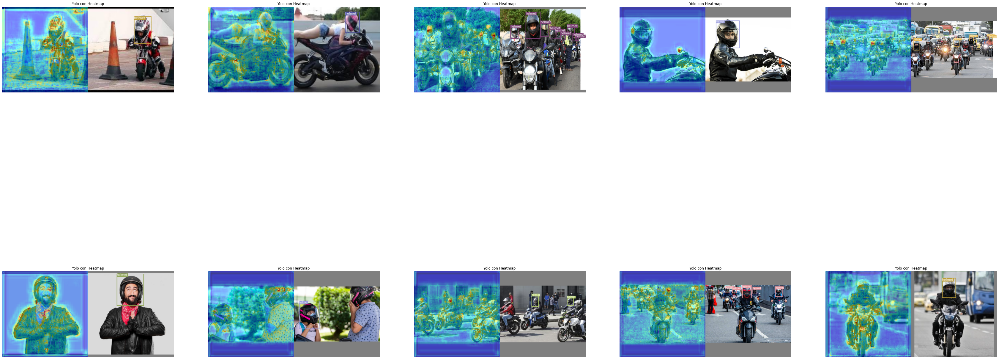

In [ ]:
#@title **Validación de imagenes con Modelo Original**
plt.figure(figsize=(60,30))
pos = 1
for m in os.listdir(Directorio):
  name = Directorio + '/' + m  
  plt.title('Yolo con Heatmap')
  if m != '.ipynb_checkpoints' and  m != 'heatmap':  
    img = cv2.imread(name)
    plt.subplot(2,5,pos)
    plt.imshow(img[:,:,(2,1,0)]) 
    plt.axis('off')
    pos += 1
plt.title('Yolo con Heatmap')
plt.show()

In [7]:
#@title  **Variables Globales para la generación del GradCam del modelo SE**
Directorio = 'results'
#Archivo con información de configuración del modelo:
model_conf = '../PyTorch-YOLOv3/config/yolov3-tiny_custom_se.cfg'
image_path  = '../PyTorch-YOLOv3/data/samples/sample_custom/'
#Tamaño de entrada de la arquitectura:
input_size = 1536
#Se crear el modelo a partir del archivo de configuración:
model = Darknet(model_conf, input_size)

##Carga de los pesos del modelo:
#1. Si se va a cargar archivo de pesos utilizar:
#weigths_path = '../PyTorch-YOLOv3/weights/yolov3-tiny.weights'
#model.load_weights(weigths_path)
#2. Si se va a cargar archivo de checkpoints utilizar:
checkpoint_path = '../PyTorch-YOLOv3/checkpoints/yolov3_ckpt_22.pth'
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))

##Capa del modelo a validar la atención:
intersting_layer = 'module_list.14.conv_14'

../PyTorch-YOLOv3/config/yolov3-tiny_custom_se.cfg


/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [21]:
#@title Forma de evidenciar los nombres de las capas del modelo:
#Validamos el nombre de las capas:
#print(model.named_modules)
#h = model.named_modules
for i in model.named_modules():
  #print(0,i[1])
  print('nombre de las capas',i[0], i[1])

nombre de las capas  Darknet(
  (module_list): ModuleList(
    (0): Sequential(
      (conv_0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batch_norm_0): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky_0): LeakyReLU(negative_slope=0.1)
    )
    (1): Sequential(
      (maxpool_1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (2): Sequential(
      (conv_2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batch_norm_2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky_2): LeakyReLU(negative_slope=0.1)
    )
    (3): Sequential(
      (maxpool_3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (4): Sequential(
      (conv_4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batch_norm_4): BatchNorm2d(64, eps=1e-

In [14]:
print(image_path)

../PyTorch-YOLOv3/data/samples/sample_custom/


In [9]:
#@title Se calcula la informacion del gradcam de las imagenes de pruebas:
for m in os.listdir(image_path):
  if m != '.ipynb_checkpoints' and  m != 'heatmap':
    #if m == 'ag_img_40.jpg' or m == 'mg_img56.jpg' or m == 'cm_img_31.png':
    #if m == 'new_img_1.png' or m == 'new_img_3.png' or m == 'new_img_4.png' or m == 'new_img_5.png' or m == 'new_img_.png':
    if m != 'ag_img_40.jpg' and m != 'mg_img56.jpg' and m != 'cm_img_31.png' and m != 'new_img_1.png' and m != 'new_img_3.png' and m != 'new_img_4.png' and m != 'new_img_5.png':
      print(m)
      name_file = m
      name_image = m.split('.')[0]
      raw_img, flag_image, image = preparated_images(image_path, name_file)
      output = gradCam_result(image, intersting_layer, name_image)
      compare_heatmap(name_image, intersting_layer)
      del output
      del raw_img
      del flag_image
      del image
      gc.collect()
    #else:
      #break
gc.collect()

new_img_6.png


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:1025: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


new_img_7.png
new_img_2.png


0

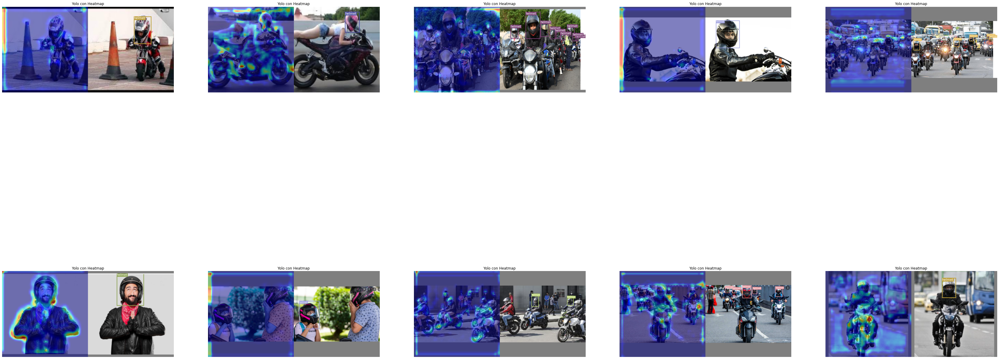

In [10]:
#@title **Validación de imagenes con Modelo Original**
plt.figure(figsize=(60,30))
pos = 1
for m in os.listdir(Directorio):
  name = Directorio + '/' + m  
  plt.title('Yolo con Heatmap')
  if m != '.ipynb_checkpoints' and  m != 'heatmap':  
    img = cv2.imread(name)
    plt.subplot(2,5,pos)
    plt.imshow(img[:,:,(2,1,0)]) 
    plt.axis('off')
    pos += 1
plt.title('Yolo con Heatmap')
plt.show()